In [ ]:
#| default_exp Presentation

---
title: "Presentation: Nautilopy applied to the 3D mapping of underwater caves"
subtitle: Overview of the work realized with Nautilopy on the underwater cave dataset
authors:
  - name: Thomas Guilment
    affiliations:
      - University of Louisiana at Lafayette
    email: thomas.guilment@gmail.com
    corresponding: true
    orcid: 0009-0003-8163-3976
  - name: Gabriele Morra
    affiliations:
      - University of Louisiana at Lafayette
  - name: Orhun Aydin
    affiliations:
      - Saint Louis University
  - name: Stefany Carty
    affiliations:
      - Saint Louis University
format:
  html:
    html-math-method: katex
    self-contained: true
    page-layout: article
    toc: true
    toc-depth: 2
    number-sections: false
jupyter: python3
execute:
  eval: true
include: true
---

![](./img/Logo_nautilopy_tiny.png)

## The underwater cave dataset {#sec-dataset}
The data are available from [https://cirs.udg.edu/caves-dataset/](https://cirs.udg.edu/caves-dataset/). See [](doi:10.1177/0278364917732838) to access to the corresponding article.

### Abstract from the authors

Authors: Angelos Maillos (see his [google scholar](https://scholar.google.com/citations?user=rKE4IEIAAAAJ&hl=en) or previous [profile](https://schmidtocean.org/person/angelos-mallios/)) *et al.*.

"We provide a data set collected with an autonomous underwater vehicle (AUV) tested in the unstructured environment of an underwater cave complex. The vehicle is equipped with two mechanically scanned imaging sonar (MSIS) to simultaneously map the caves' horizontal and vertical surfaces, a Doppler velocity log (DvL), two inertial measurement units (IMUs), a depth sensor, and a vertically mounted camera imaging the sea-floor for ground truth validation in specific points. Here we present data using this testbed that was collected while guided by a diver, due to the caves' spatial complexity, during July 2013. For ease of use, the original ROS bag files are provided accompanied by a derivative version combining imagery and human-readable text files for processing on other environments."

::: {layout-ncol=2}
![The approximate path traveled underwater overlaid on an aerial image from Google Earth.](./img/CavesGoogleEarth2.jpg){#fig-AUV_config width=100%}

![AUV configuration](./img/auv_config.png){#fig-CaveGoogleEarth width=100%}  

::: 


::: {.callout-warning}
#### Error in Super Seaking Reference axis
There is an error on the 3D axis representation of the vertical SONAR. The X-axis should point to the seafloor (not to the sky). In this work, a 180° degrees rotation around the Z axis was applied.
:::

### Dataset information - overview

::: {.panel-tabset}

#### Navigation
Odometry - 3D Pose and orientation

#### Acoustic Exploration
Horizontal (Micron) and vertical (Seaking) SONAR  

#### Video Exploration
Camera

:::

::: {.callout-note collapse="false"}
## Dataset in details

Available data from sensors:

- **/depth_sensor:** DS2806 HPS-A pressure sensor data.
- **/dvl_linkquest:** LinkQuest NavQuest 600 sensor data. Contains bottom and water-referenced velocities and other important sensor data.
- **/imu_adis:** Analog Devices ADIS16480 sensor data. Contains orientation as both Euler angles and quaternion. It also contains raw data for accelerometers, gyros, magnetometers, and temperature, and an estimation of the gyro biases.
- **/imu_adis_ros:** Analog Devices ADIS16480 sensor orientation [using standard IMU ROS message.](http://wiki.ros.org/sensor_msgs)
- **/imu_xsens_mti:** Xsens MTi sensor data. Same message type and the same information as the topic /imu_adis.
- **/imu_xsens_mti_ros:** Xsens MTi sensor orientation using standard IMU ROS message.
- **/odometry:** estimation of the robot pose provided as a [standard Odometry ROS message.](http://wiki.ros.org/nav_msgs)
- **/sonar_micron:** Tritech Micron DST sensor beam data.
- **/sonar_micron_ros:** Micron data provided as [standard Laserscan ROS message.](http://wiki.ros.org/sensor_msgs)
- **/sonar_seaking:** Tritech Super SeaKing DFP profiler sensor beam data.
- **/sonar_seaking_ros:** profiler data provided as standard Laserscan ROS message.
- **/tf:** [standard ROS messages](http://wiki.ros.org/tf) containing sensor offsets.

![Sensors offset from Maillos _et al._](./img/sensors_offset.png){#fig-sensors-offset fig-align="left" width=50%}  
:::

### Import Nautilopy

In [ ]:
from nautilopy.core import *

## Prepare the data

The ROS bag data were extracted using the Python package `Bagpy`, (see this [link to notebook](#sec-ros2csv) to see how to use it) and each topic was converted into a CSV file. Then, the original dataset has been evaluated, interpolated, and saved as a pickle file.

For more information, don't hesitate to check the documentation on Preprocessing or chekcing the `01_Preprocessing.ipynb` notebook by clicking this [link](#sec-save-workspace). During the data pre-processing phase, the vertical sonar orientation 3D axis has proven to be wrong, which is why there is a correction at the end of this external notebook.

### Load the pre-processed data
A little trick to get the `globals()` 
(local variables in the workspace) from an outside function by passing the local `globals` variables from the current notebook. This is like using the common Matlab `workspace` or local variable using Pickle in Python.

In [ ]:
l_var = os.listdir('./data/Pickle_dataset/')
# print(*l_var, sep='\n')

# Load only the needed variables
glob = globals()
f_load_var ("./data/Pickle_dataset/", glob, ['m_pos_auv','m_ypr','v_timestamp_nav.pkl'])
del glob

## Visualization of the AUV orientation over the trajectory {#sec-visualization}
This part presents different solutions to visualize the AUV orientation over its trajectory. The goal is to check that the AUV orientation is correct and validate our display.

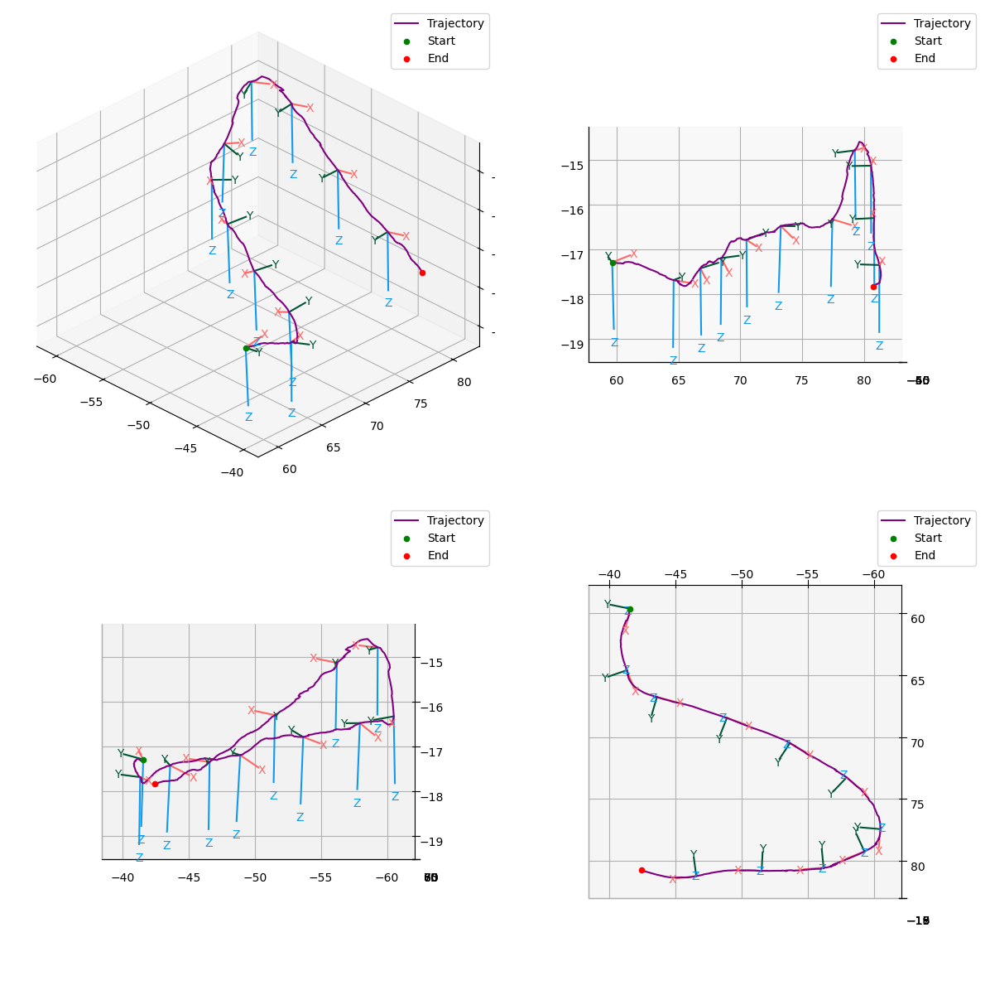

In [ ]:
%matplotlib inline
f_plot_auv_orientation_subplots(m_pos_auv, m_ypr)

## Interactive AUV orientation over trajectory
Example of an interactive plot of the Autonomous 3D orientation axis over its trajectory.
First with `Matplotlib` then with `plotly`.

In [ ]:
#| hide
# Ensure to be back to inline backend
%matplotlib inline
plt.close('all')

In [ ]:
anim_auv_orientation = f_create_auv_orientation_animation(m_pos_auv[::2], m_ypr[::2])

In [ ]:
display(HTML(anim_auv_orientation.to_jshtml()))

In [ ]:
h_fig = f_create_auv_orientation_animation_plotly(m_pos_auv, m_ypr, v_timestamp_nav)
h_fig.show()

## Vertical and horizontal SONAR data investigation

The received signals can be seen over time as an image. Each waveform can be plotted as curves. The Y axis from top to bottom represents the distance from which the energy is received. The X axis is the time.

In [ ]:
#| hide
plt.close('all')
%matplotlib inline

In [ ]:
l_var

['m_sonar_seaking_clean.pkl',
 'v_offset_ypr_seaking.pkl',
 'v_altitude_seafloor.pkl',
 'm_sonar_micron_clean.pkl',
 'm_interp_micron_YPR.pkl',
 'v_offset_pos_micron.pkl',
 'm_interp_seaking_YPR.pkl',
 'v_timestamp_nav.pkl',
 'v_offset_ypr_micron.pkl',
 'm_sonarReceivedIntensity_seaking_final.pkl',
 'm_pos_auv.pkl',
 'v_range_micron.pkl',
 'm_sonar_seaking_clean_hyst.pkl',
 'm_velocityInst_xyz.pkl',
 'v_angles_rad_seaking_final.pkl',
 'm_sonar_micron_clean_hyst.pkl',
 'm_ypr.pkl',
 'v_depth.pkl',
 'm_sonarReceivedIntensity_micron_final.pkl',
 'v_timestamp_sonar_micron_final.pkl',
 'v_timestamp_dvl.pkl',
 'v_offset_pos_seaking.pkl',
 'v_angles_rad_micron_final.pkl',
 'v_timestamp_depth.pkl',
 'm_interp_pos_seaking_final.pkl',
 'm_interp_pos_micron_final.pkl',
 'v_range_seaking.pkl',
 'v_timestamp_sonar_seaking_final.pkl']

In [ ]:
# Load only the needed variables
glob = globals()
f_load_var ("./data/Pickle_dataset/", glob, ['m_sonarReceivedIntensity_micron_final','v_angles_rad_micron_final','v_range_micron','m_sonar_micron_clean','m_interp_pos_micron_final' ])
del glob

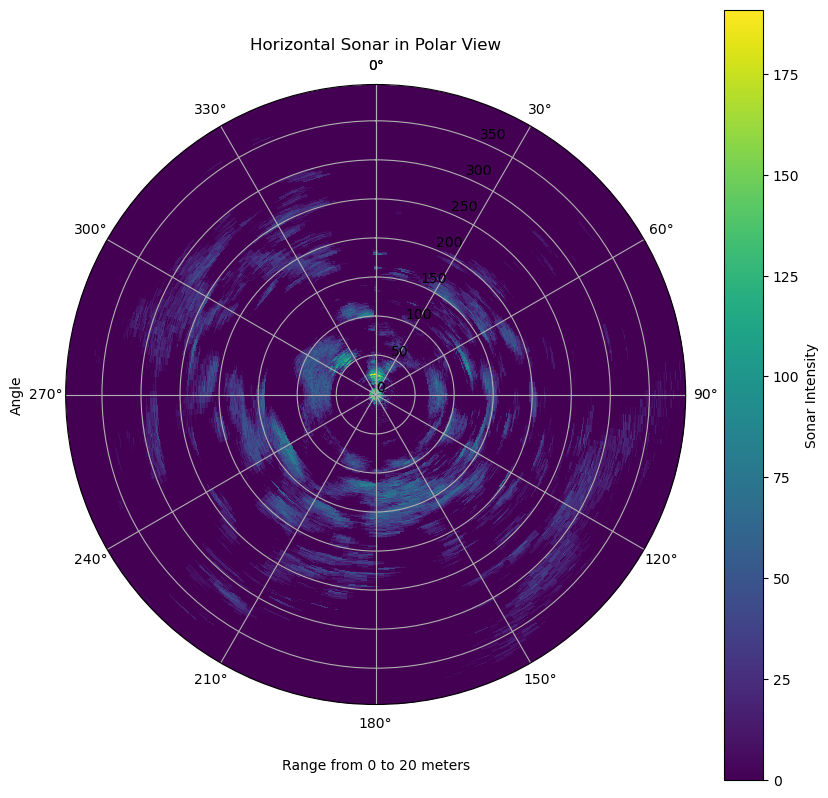

In [ ]:
d_start_micron = 194
d_end_micron = d_start_micron + 200
m_sonar = m_sonarReceivedIntensity_micron_final[:,d_start_micron:d_start_micron+200]
v_angle = v_angles_rad_micron_final[d_start_micron:d_start_micron+200]
f_plot_polar_sonar_micron(m_sonar, v_angle)

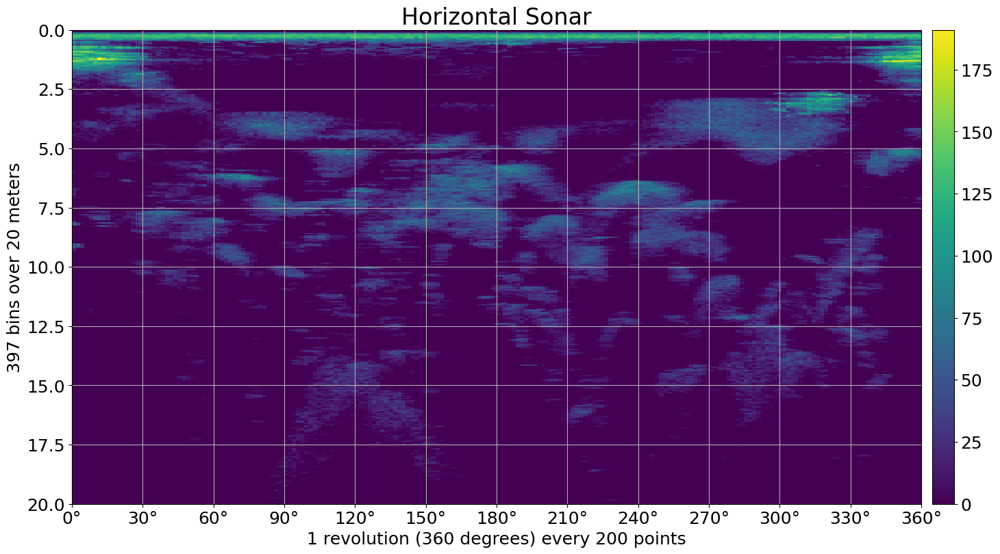

In [ ]:
d_image_width = 201
d_start_micron = 194
d_end_micron = d_start_micron + d_image_width
m_sonar_micron = m_sonarReceivedIntensity_micron_final[:, d_start_micron:d_end_micron]
v_angles_rad = v_angles_rad_micron_final
f_plot_horizontal_sonar_with_angles(m_sonar_micron, v_angles_rad, d_start_micron, d_image_width, v_range_micron)

In [ ]:
# Load only the needed variables
glob = globals()
f_load_var ("./data/Pickle_dataset/", glob, ['m_sonarReceivedIntensity_seaking_final', 'v_angles_rad_seaking_final','v_range_seaking','m_interp_pos_seaking_final','m_sonar_seaking_clean'])
del glob

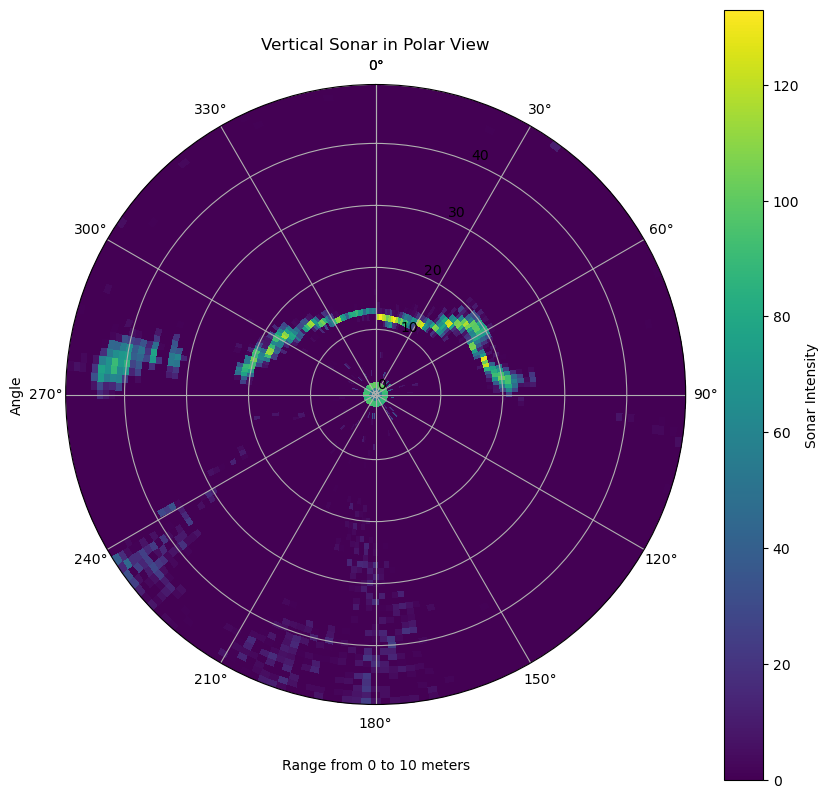

In [ ]:
d_start_seaking = 95
d_end_seaking = d_start_seaking + 201
m_sonar = m_sonarReceivedIntensity_seaking_final[:,d_start_seaking:d_end_seaking]
v_angle = v_angles_rad_seaking_final[d_start_seaking:d_end_seaking]
f_plot_polar_sonar_seaking(m_sonar, v_angle)

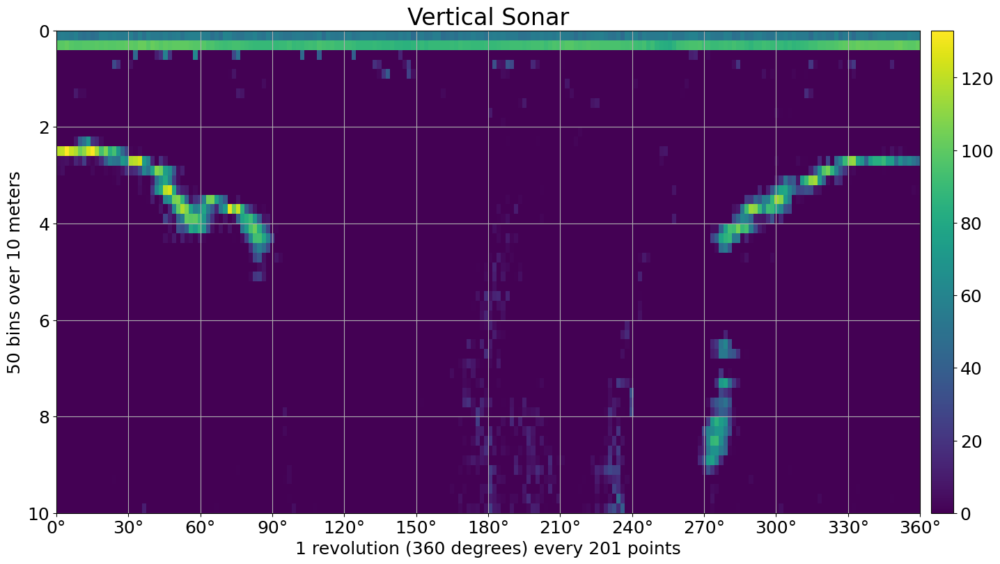

In [ ]:
d_image_width = 202
d_start_seaking = 95
d_end_seaking = d_start_seaking + d_image_width
m_sonar_seaking = m_sonarReceivedIntensity_seaking_final[:, d_start_seaking:d_end_seaking]
v_angles_rad = v_angles_rad_seaking_final
f_plot_vertical_sonar_with_angles(m_sonar_seaking, v_angles_rad, d_start_seaking, d_image_width, v_range_seaking)

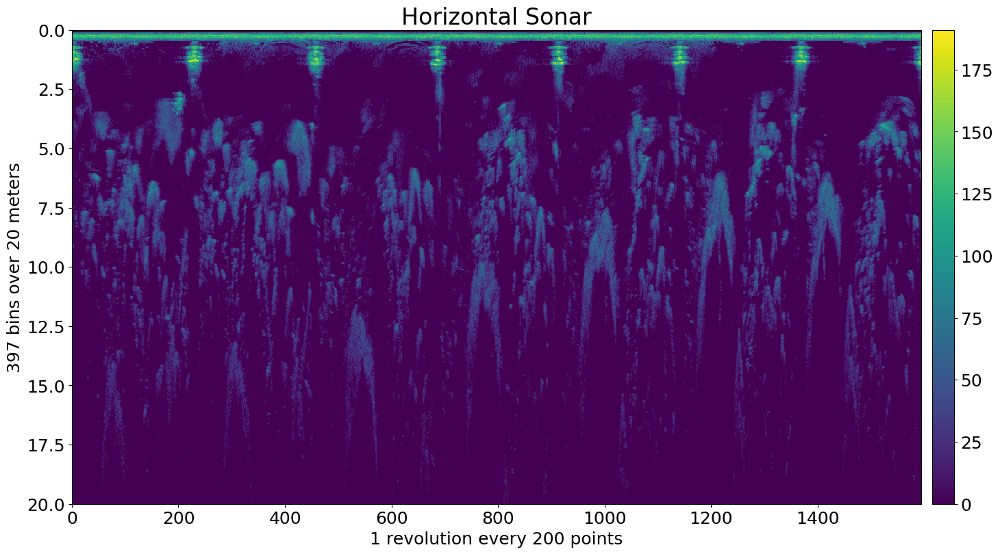

In [ ]:
d_image_width = 1400
d_start_micron = 194
d_end_micron = d_start_micron + d_image_width
m_sonar_micron = m_sonarReceivedIntensity_micron_final[:, d_start_micron:d_end_micron]
f_plot_horizontal_sonar(m_sonar_micron, d_start_micron, d_image_width, v_range_micron)

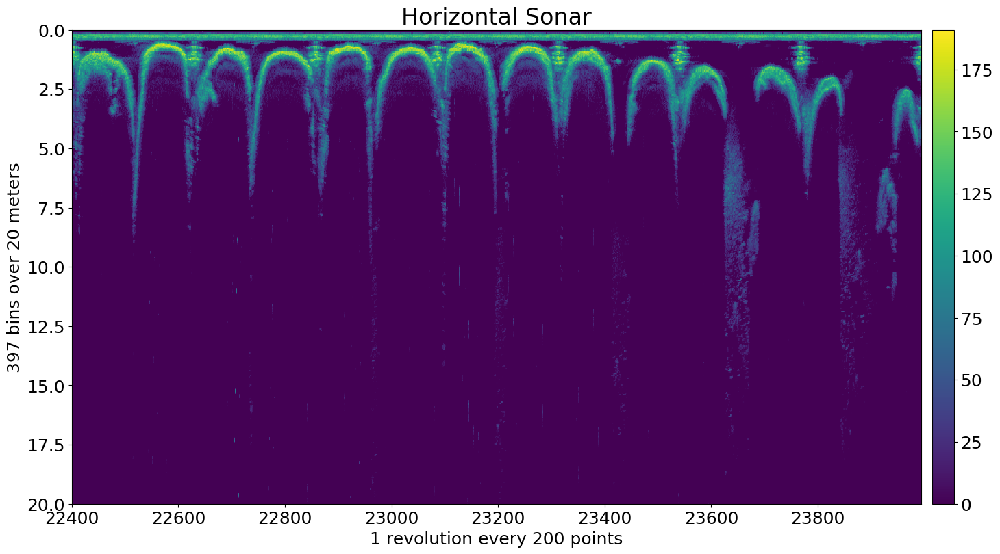

In [ ]:
d_start_micron = 194+22400  # Angle is 0 rad
d_end_micron = d_start_micron + 1400
m_sonar_micron = m_sonarReceivedIntensity_micron_final[:, d_start_micron:d_end_micron]
f_plot_horizontal_sonar(m_sonar_micron, d_start_micron, d_image_width, v_range_micron)

### Interactive analysis
Widget to update the part of the trajectory in color associated with the sonar image below

In [ ]:
plt.close('all')
%matplotlib inline

In [ ]:
# f_micron_with_trajectory(m_interp_pos_micron_final, m_sonarReceivedIntensity_micron_final, v_range_micron)

## Cleaning the SONAR data

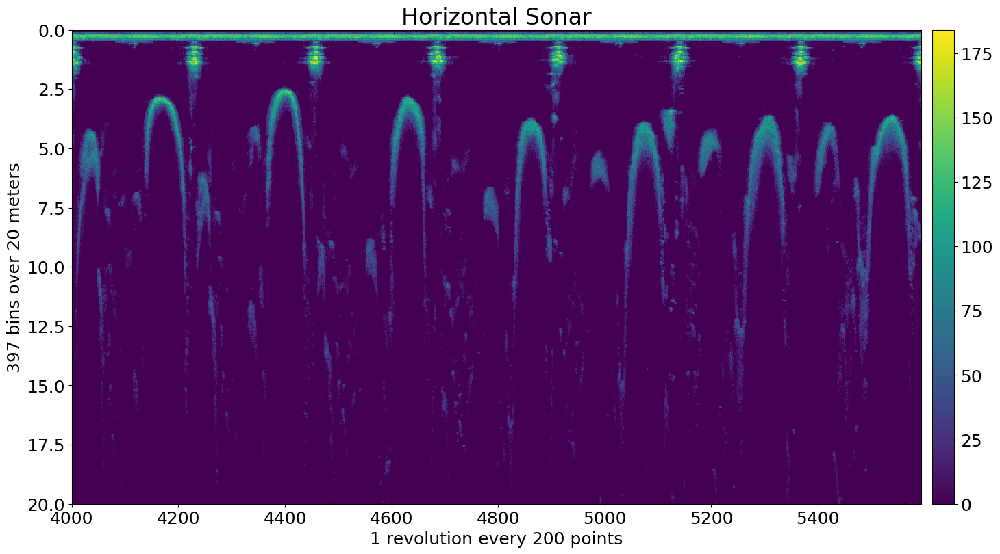

In [ ]:
#%matplotlib widget
d_start_micron = 194+4000  # Angle is 0 rad
d_end_micron = d_start_micron + 1400
m_sonar_micron = m_sonarReceivedIntensity_micron_final[:, d_start_micron:d_end_micron]
f_plot_horizontal_sonar(m_sonar_micron, d_start_micron, d_image_width, v_range_micron);

In [ ]:
#| hide
%matplotlib inline
plt.close('all')

#### Mask creation from intensity
When the wall detection is close by, removing the body frame detection with a simple rectangle could also remove the detected wall.
The idea is to create a mask of the body frame detection with intensity and subtract this intensity from the total data.
In the case of font body detection, the wall detection doesn't seem to overlap the AUV body frame detection so a simple replacement of values should suffice.  

Let's find a spot where the detected walls are very far to isolate only the body frame detection

In [ ]:
m_mask_instensity_back = m_sonarReceivedIntensity_micron_final[0:70, 594 - 35 : 594 + 35].copy()
d_length_back_beam = 70
d_length_back_start = -35
d_length_back_end = 35

m_mask_intensity_front = m_sonarReceivedIntensity_micron_final[0:30, 4064:4134].copy()
d_length_front_start = -35
d_length_front_end = 35
d_length_front_beam = 30

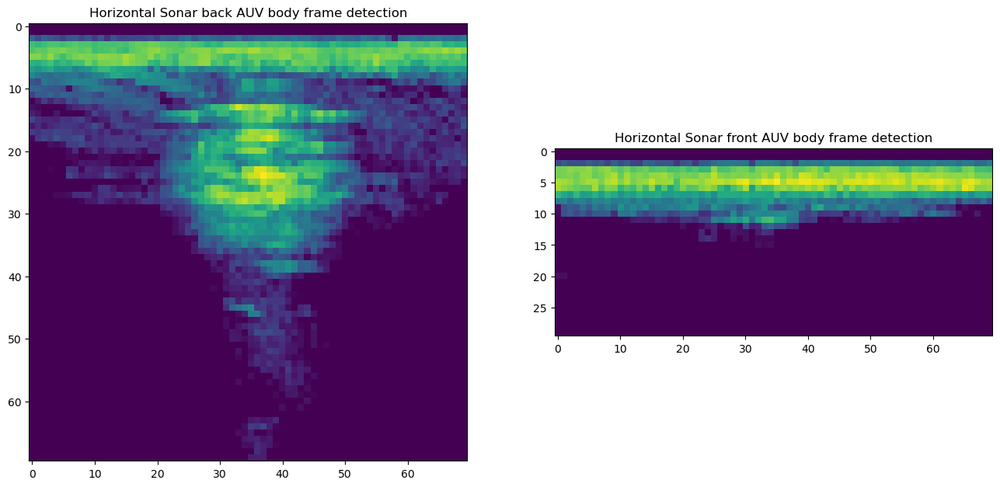

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(16, 9))
ax[0].set_title("Horizontal Sonar back AUV body frame detection")
ax[0].imshow(m_sonarReceivedIntensity_micron_final[0:d_length_back_beam, 594 + d_length_back_start : 594 + d_length_back_end])

ax[1].set_title("Horizontal Sonar front AUV body frame detection")
ax[1].imshow(m_sonarReceivedIntensity_micron_final[0:d_length_front_beam, 4099 + d_length_front_start : 4099 + d_length_front_end]);

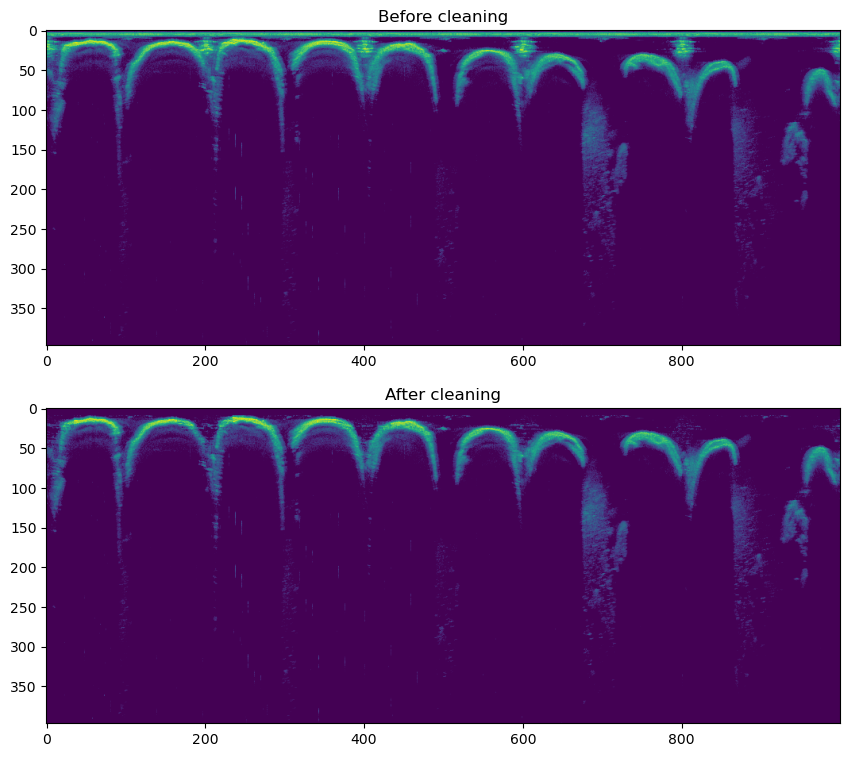

In [ ]:
%matplotlib inline
plt.close('all')

d_start_micron = 22994
d_end_micron = d_start_micron + 1000

fig, ax = plt.subplots(2, 1, figsize=(16, 9))
ax[0].set_title("Before cleaning")
ax[0].imshow(m_sonarReceivedIntensity_micron_final[:, d_start_micron:d_end_micron])

ax[1].set_title("After cleaning")
ax[1].imshow(m_sonar_micron_clean[:, d_start_micron:d_end_micron]);

## 3D point cloud from combining both SONAR data with a uniform colormap based on cleaned data

In [ ]:
# Load only the needed variables
glob = globals()
f_load_var ("./data/Pickle_dataset/", glob, ['v_timestamp_sonar_seaking_final', 'v_timestamp_sonar_micron_final','m_interp_micron_YPR','m_interp_seaking_YPR'])
del glob

In [ ]:
d_start_micron = 0 
d_end_micron =  d_start_micron + np.shape(m_sonar_micron_clean)[1]-1 #6500

# Put the seaking start accordingly to the micron one
d_start_seaking = np.argmin(np.abs(v_timestamp_sonar_seaking_final - v_timestamp_sonar_micron_final[d_start_micron]))
d_end_seaking = np.argmin(np.abs(v_timestamp_sonar_seaking_final - v_timestamp_sonar_micron_final[d_end_micron]))

# The max values are selected when d_tresh = -1
m_point_cloud_micron_max = f_pointCloud(
    m_interp_pos_micron_final[d_start_micron:d_end_micron,:], 
    m_interp_micron_YPR[d_start_micron:d_end_micron,:], 
    m_sonar_micron_clean[:,d_start_micron:d_end_micron], 
    v_angles_rad_micron_final[d_start_micron:d_end_micron], 
    d_max_range=20, 
    d_thresh=-1)

m_point_cloud_seaking_max = f_pointCloud(
    m_interp_pos_seaking_final[d_start_seaking:d_end_seaking,:], 
    m_interp_seaking_YPR[d_start_seaking:d_end_seaking,:], 
    m_sonar_seaking_clean[:,d_start_seaking:d_end_seaking], 
    v_angles_rad_seaking_final[d_start_seaking:d_end_seaking], 
    d_max_range=10, 
    d_thresh=-1)

/Users/thomas/Documents/20KUTS/Geoprocessing with Python/nbdev-env/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3577: UserWarning:

Gimbal lock detected. Setting third angle to zero since it is not possible to uniquely determine all angles.



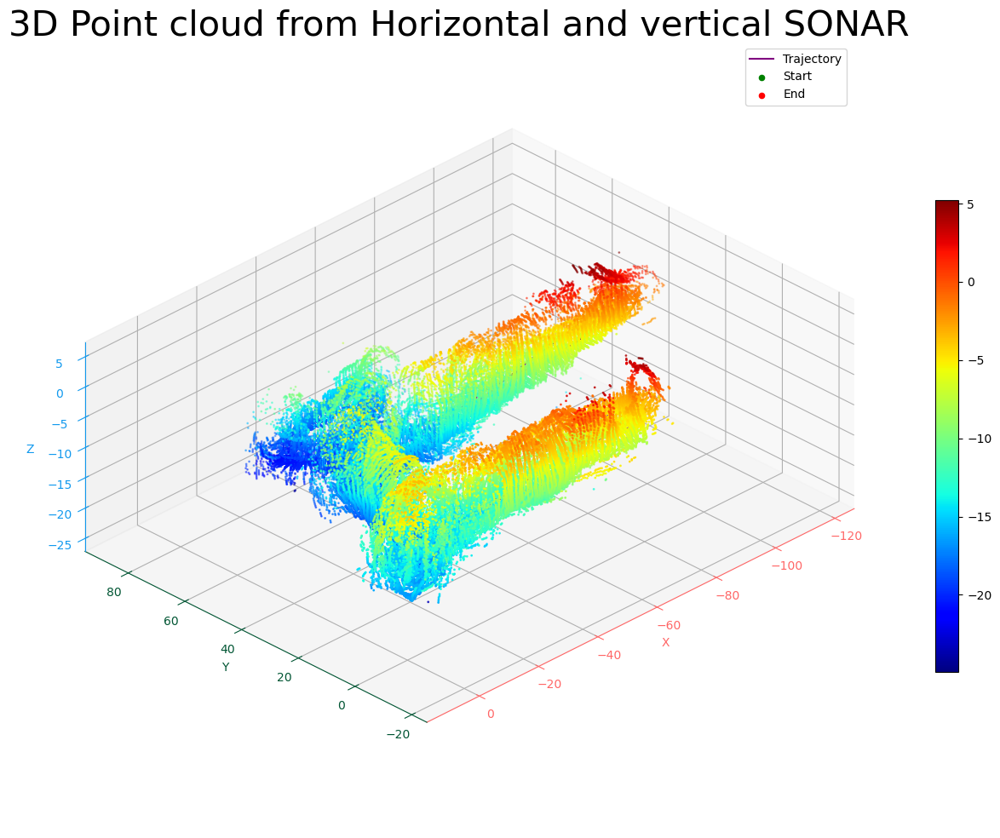

In [ ]:
%matplotlib inline
plt.close('all')
fig = plt.figure(figsize=(25,12))
ax = fig.add_subplot(projection="3d", proj_type="ortho",box_aspect=(5,4,2))

# Put the axis in color and name them (X,Y,Z)
colors = ("#FF6666", "#005533", "#1199EE")  # Colorblind-safe RGB
for i, (axis, c) in enumerate(zip((ax.xaxis, ax.yaxis, ax.zaxis),
                                  colors)):
    axlabel = axis.axis_name
    axis.set_label_text(axlabel)
    axis.label.set_color(c)
    axis.line.set_color(c)
    axis.set_tick_params(colors=c)

m_pos_micron = m_interp_pos_micron_final[d_start_micron:d_end_micron,:].copy()
m_pos_micron[:,2] = -m_pos_micron[:,2]

m_pos_seaking = m_interp_pos_seaking_final[d_start_seaking:d_end_seaking,:].copy()
m_pos_seaking[:,2] = -m_pos_seaking[:,2]

micron_color = m_point_cloud_micron_max[:,2 ] #np.concatenate(l_intensity_micron)
seaking_color = m_point_cloud_seaking_max[:,2]

# Put the same max and min value to have the same color map
d_min = np.min((np.min(micron_color),np.min(seaking_color)))
d_max = np.max((np.max(micron_color),np.max(seaking_color)))
micron_color[micron_color == np.min(micron_color)] = d_min
seaking_color[seaking_color == np.min(seaking_color)] = d_min

micron_color[micron_color == np.max(micron_color)] = d_max
seaking_color[seaking_color == np.max(seaking_color)] = d_max

# Plot trajectory with beginning and end
# f_plot_3d_trajectory(ax,m_pos_micron)
f_plot_3d_trajectory(ax,m_pos_seaking)

p = ax.scatter(m_point_cloud_micron_max[:,0], m_point_cloud_micron_max[:,1], m_point_cloud_micron_max[:,2], s=1, c=micron_color, cmap='jet', label='Micron')
p = ax.scatter(m_point_cloud_seaking_max[:,0], m_point_cloud_seaking_max[:,1], m_point_cloud_seaking_max[:,2], s=1, c=seaking_color, cmap='jet', label='Seaking')

ax.set_title("Perspective view map ")
# ax.legend()
ax.view_init(30,45)
ax.invert_yaxis()

ax.set_title("3D Point cloud from Horizontal and vertical SONAR", fontsize=30)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

ax.dist = 0

fig.colorbar(p,shrink=0.6)
plt.show()

::: {.callout-note}
## Link to external notebooks

See all the processes that have been done on the data from the CSV dataset to the pickle file:  
\ \ [01_Preprocessing.ipynb](./01_Preprocessing.ipynb){#sec-save-workspace}  


See how to extract ROS bag data and convert each topic to a CSV file:  
\ \ [ROSbag2csv.ipynb](./ROSbag2csv.ipynb){#sec-ros2csv}  

:::

In [ ]:
#| hide
import nbdev; nbdev.nbdev_export()